In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install kaggle

**Change the current working directory where you want to download the kaggle dataset**

In [ ]:
%cd /content/gdrive/MyDrive/Kaggle/

/content/gdrive/MyDrive/Kaggle


**Run the following code to configure the path to “kaggle.json”**

In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content/gdrive/MyDrive/Kaggle/'

**Download the dataset**

In [ ]:
!kaggle datasets download -d densus100/car-damage-coco-dataset

 94% 134M/143M [00:04<00:00, 45.1MB/s]
100% 143M/143M [00:04<00:00, 32.5MB/s]


**Creating a directory to save dataset**

In [ ]:
!mkdir /content/dataset

**Unzip dataset**

In [ ]:
!unzip -q /content/gdrive/MyDrive/Kaggle/car-damage-coco-dataset.zip -d /content/dataset

**Cloning Detectron2 GitHub Repo**

In [ ]:
!git clone https://github.com/facebookresearch/detectron2
%cd detectron2

Cloning into 'detectron2'...
remote: Enumerating objects: 14054, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 14054 (delta 1), reused 9 (delta 1), pack-reused 14044
Receiving objects: 100% (14054/14054), 5.78 MiB | 17.88 MiB/s, done.
Resolving deltas: 100% (10162/10162), done.
/content/detectron2


**Installing compatible version of PyTorch for Detectron2**

In [ ]:
!pip install pyyaml==5.1 fvcore omegaconf 

     |████████████████████████████████| 274 kB 5.2 MB/s 
     |████████████████████████████████| 50 kB 5.8 MB/s 
     |████████████████████████████████| 74 kB 3.1 MB/s 
     |████████████████████████████████| 112 kB 45.1 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=7e8d3eb688f38949c390680536d882646144380721cc12778d70908bce671793
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220506-py3-none-any.whl size=61284 sha256=f36d6a02997a0b9bdb31d3cc6566f18e1183128e4a0ef270a90e8868a150f425
  Stored in directory: /root/.cache/pip/wheels/f5/ef/3c/708de8799f89f0871bd209866831fe3885db93fa090608fa73
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=326a00e4b32b05a0716e04afa5501b0b59cef7f475d244fbe25479919d951a24
  Stored in directory: /root/.cache/pip/wheels/ca/33/b7/

In [ ]:
!pip install torch==1.10.0+cu111 torchvision==0.11.0+cu111 torchaudio==0.10.0 torchtext==0.11.0 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████▌                   | 834.1 MB 1.5 MB/s eta 0:14:35tcmalloc: large alloc 1147494400 bytes == 0x3963e000 @  0x7fbda96f9615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |███████████████▉                | 1055.7 MB 1.5 MB/s eta 0:12:00tcmalloc: large alloc 1434370048 bytes == 0x7dc94000 @  0x7fbda96f9615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |████████████████████            | 1336.2 MB 1.4 MB/s eta 0:09:45tcmalloc: large alloc 1792966656 bytes =

**Install detectron2**

In [ ]:
import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html


torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 874 kB/s 
     |████████████████████████████████| 147 kB 5.5 MB/s 
     |████████████████████████████████| 130 kB 47.4 MB/s 
     |████████████████████████████████| 749 kB 46.6 MB/s 
     |████████████████████████████████| 843 kB 39.6 MB/s 
  Attempting uninstall: regex
    Found existing installation: regex 2019.12.20
    Uninstalling regex-2019.12.20:
      Successfully uninstalled regex-2019.12.20
  Attempting uninstall: importlib-resources
    Found existing installation: importlib-resources 5.7.1
    Uninstalling importlib-resources-5.7.1:
      Successfully uninstalled importlib-resources-5.7.1


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
train_dataset_name = 'train'
train_images_path = '/content/dataset/train'
train_json_annot_path = '/content/dataset/train/annotations.json'

test_dataset_name='test'
test_images_path='/content/dataset/test'
test_json_annot_path = '/content/dataset/valid/annotations.json'

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances(name = train_dataset_name, metadata = {},
                       json_file = train_json_annot_path, 
                        image_root = train_images_path)

register_coco_instances(name= test_dataset_name, metadata ={},
                        json_file = test_json_annot_path,
                        image_root=test_images_path)
MetadataCatalog.get('train').thing_classes=['Car-Damage']

[05/07 03:10:00 d2.data.datasets.coco]: Loaded 596 images in COCO format from /content/dataset/train/annotations.json


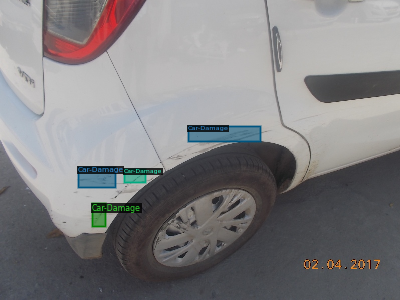

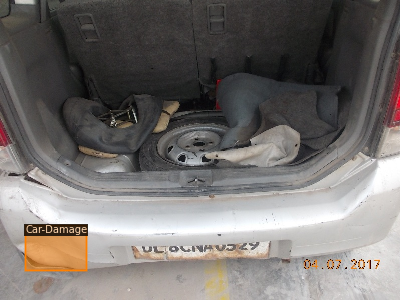

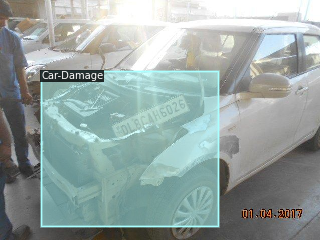

In [ ]:
# Visualize training data-
train_metadata = MetadataCatalog.get('train')
dataset_dicts = DatasetCatalog.get('train')

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

**Training**

In [ ]:
from detectron2.engine import DefaultTrainer
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_C4_3x.yaml"))
cfg.DATASETS.TRAIN = ('train',)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_C4_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00125
cfg.SOLVER.MAX_ITER = 500
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here. (copied from the official detectron2 tutorial)
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/07 03:10:28 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_a2914c.pkl: 220MB [00:04, 53.3MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 2048) in the checkpoint but (2, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 2048) in the checkpoint but (4, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[05/07 03:10:45 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/07 03:12:11 d2.utils.events]:  eta: 0:33:49  iter: 19  total_loss: 1.53  loss_cls: 0.4527  loss_box_reg: 0.04665  loss_mask: 0.6885  loss_rpn_cls: 0.2894  loss_rpn_loc: 0.02906  time: 4.2550  data_time: 0.0243  lr: 4.8702e-05  max_mem: 6038M
[05/07 03:13:36 d2.utils.events]:  eta: 0:32:23  iter: 39  total_loss: 1.251  loss_cls: 0.1622  loss_box_reg: 0.05371  loss_mask: 0.6698  loss_rpn_cls: 0.2765  loss_rpn_loc: 0.03986  time: 4.2535  data_time: 0.0093  lr: 9.8653e-05  max_mem: 6038M
[05/07 03:15:02 d2.utils.events]:  eta: 0:31:06  iter: 59  total_loss: 1.117  loss_cls: 0.1052  loss_box_reg: 0.08509  loss_mask: 0.6167  loss_rpn_cls: 0.2355  loss_rpn_loc: 0.04912  time: 4.2715  data_time: 0.0087  lr: 0.0001486  max_mem: 6038M
[05/07 03:16:26 d2.utils.events]:  eta: 0:29:38  iter: 79  total_loss: 0.97  loss_cls: 0.1045  loss_box_reg: 0.07954  loss_mask: 0.5824  loss_rpn_cls: 0.1695  loss_rpn_loc: 0.0377  time: 4.2589  data_time: 0.0087  lr: 0.00019855  max_mem: 6038M
[05/07 03:17:52 

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

**Inference and Evaluation using trained-model**

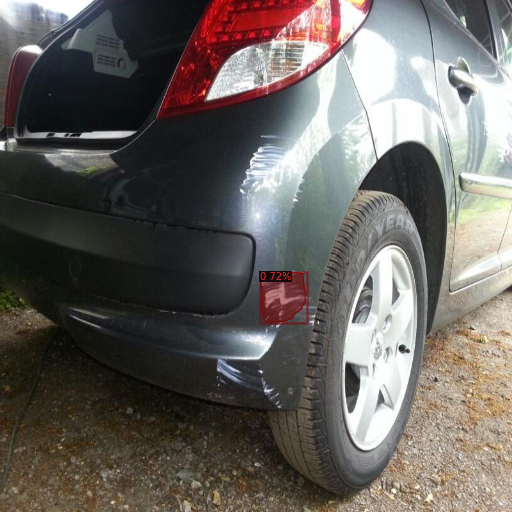

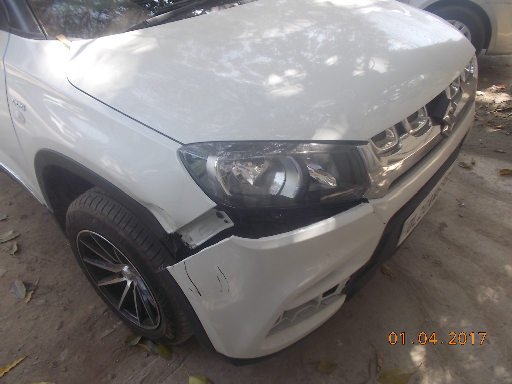

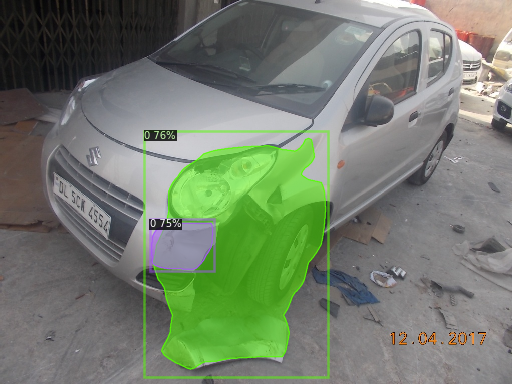

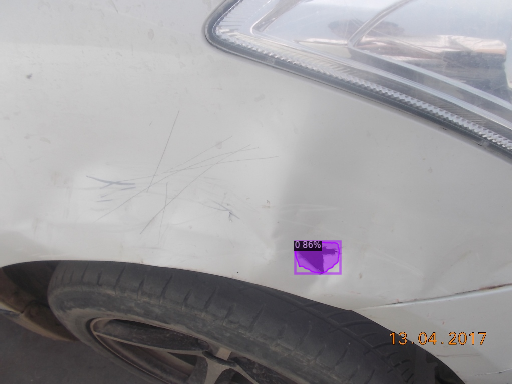

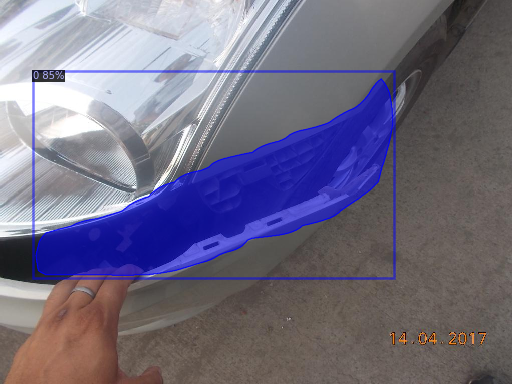

In [ ]:
'''
Inference should use the config with parameters that are used in training cfg now already contains everything we've set previously. We 
changed it a little bit for inference:
'''
from detectron2.engine import DefaultPredictor
import matplotlib.pyplot as plt 
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, '/content/output/model_final.pth')  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1], metadata={}, scale=0.5, instance_mode=ColorMode.SEGMENTATION)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

**Saving and Reloading Model**

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, 'model_final.pth')

In [ ]:
import torch
new_cfg = get_cfg()
new_cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_C4_3x.yaml"))
new_cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
new_cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7 # Set a custom testing threshold
new_cfg.MODEL.WEIGHTS = "./output/model_final.pth"

In [ ]:
# Export save checkpoints for future inference
%cp /content/output/car_damage.pth -d /content/gdrive/MyDrive/datasets